## Machine Learning Project
## DATS6202
## Nhung Nguyen & Winnie Hu

### Introduction

To reduce Barcelona’s accident rate, it is informative to learn about the location and the time that accidents occurs most. It is also useful to explore the correlation between accident and other factors including transportation types and unemployment rate. Through analyzing location, time, and other factors that correlate with accident, this project will show possible prevention for Barcelona’s accident rate. 

The link to our dataset: https://www.kaggle.com/xvivancos/barcelona-data-sets#unemployment.csv

### Literature Research 

https://www.sciencedirect.com/science/article/pii/S0386111216300085 

This research primarily discusses three non-human factors that cause traffic accidents. These factors are the development of public transportation, improvement of road ratio, and the traffic management measures. By studying the traffic accidents condition in Indonesia, the author argues that the use of motorbike is a major factor that complicates the traffic system in Jakarta, and therefore increasing investment in public transportation is a top choice for policy makers to combat traffic accidents. 


https://deepblue.lib.umich.edu/bitstream/handle/2027.42/208/48596.0001.001.pdf;sequence=2

This study found that economic conditions have a negative correlation with injuries rate. In this article, the author argues that a higher unemployment rate correlates with a lower injuries rate. The rationale behind is that when the economic condition improves, there are more active travel activities on the highway, which consequently causing more traffics.


### Research Question

This project explores the determinants of traffic accidents in Barcelona. Particularly, we want to study whether location, transportation type, time, and unemployment rate is correlated with traffic accidents. 

### Data Prepocessing

The 3 datasets were combined using Python. For instance, the transportation dataset was cleaned and then each transportation type were turned into dummies features. 
For unemployment dataset, we calculated the sum of the registered unemployment individuals over one year per each district in Barcelona. We then merged the employment rate with the original dataset based on the key of District Name. 
We deleted all NA values since our dataset has a large amount of samples. We then turned all the district name, week days, and month into dummies variable as well.


### Methodology

We created a data set with categorical target that represents the severity of accidents based on mild and serious injuries.

In this project, we want to focus on studying the correlations between traffic accidents and several non-human factors, including location, transportation type, time, and unemployment rate. Therefore, we humanly selected a set of features based on our research interests before running the models. 

Particularly, we want to study how traffic accidents perform during summer time (June - August), and at locations that have commonly seen transportation types, including Airport train, Cableway, Maritime station, Railway (FGC), and Underground.



In [1]:
#load packages
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

import matplotlib.pyplot as plt
from imblearn.over_sampling import RandomOverSampler

In [2]:
#load the data
df2_merged = pd.read_csv('Combined_classified_target.csv')
#delete the index column python created
df2_merged = df2_merged.drop('Unnamed: 0', axis =1)

### Feature importance

In [3]:
#choose selected features 
df4 = pd.DataFrame(df2_merged[['Target','Airport train', 'Cableway', 'Maritime station', 'Railway (FGC)', 'Unemp Number',
'District Name_Eixample','District Name_Les Corts','District Name_Sant Martí', 'District Name_Sarrià-Sant Gervasi',
'District Name_Sants-Montjuïc']])

X = df4.drop('Target', axis=1)

y = df4['Target']

#Create feature value name
feature_value_names = X.columns

# RandomOverSampler (with random_state=0)

ros = RandomOverSampler(random_state=0)
X, y = ros.fit_sample(X, y)

In [4]:
# Create the pipeline with StandardScaler and MyFastLinearRegression

pipe_rf = Pipeline([('StandardScaler', StandardScaler()), ('RandomForestClassifier', RandomForestClassifier())])

pipe_rf.fit(X, y)


Pipeline(memory=None,
     steps=[('StandardScaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('RandomForestClassifier', RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min...obs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False))])

In [5]:
# Convert the importances into one-dimensional 1darray with corresponding df column names as axis labels
f_importances = pd.Series(pipe_rf.named_steps['RandomForestClassifier'].feature_importances_, feature_value_names)

# Sort the array in descending order of the importances
f_importances = f_importances.sort_values(ascending=False)


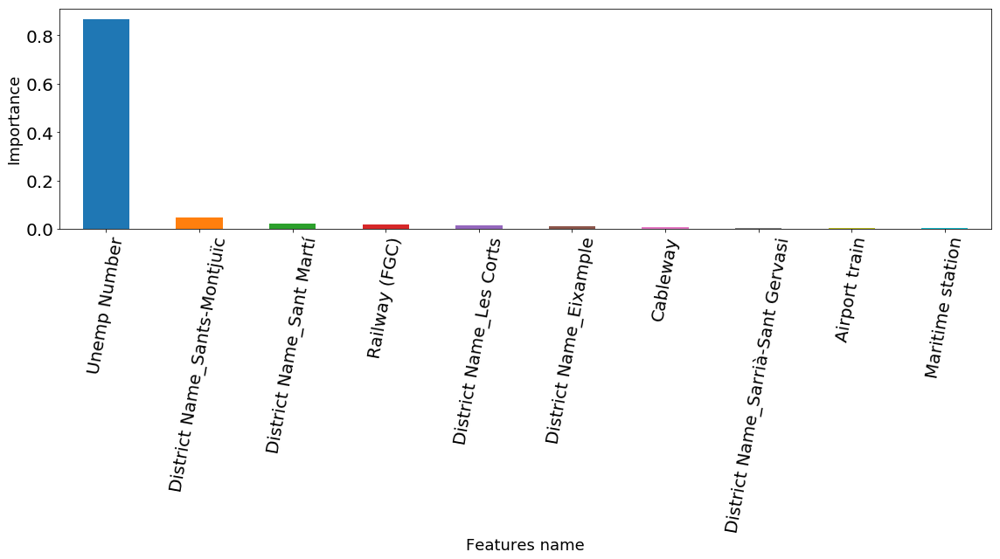

In [6]:
# Draw the bar Plot from f_importances 
h = f_importances.plot(x='Features', y='Importance', kind='bar', figsize=(16,9), rot=80, fontsize=20)
#show the plot
h.set_ylabel('Importance', fontsize = 18)
h.set_xlabel('Features name', fontsize = 18)
plt.tight_layout()
plt.show()

## Models

Decision tree, Knn, and random forest.


### Models using hyperparameter tuning (adapted from exercise 7)

In [7]:
#Import necessary packages


from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

In [8]:
#choose selected features
df2 = pd.DataFrame(df2_merged[['Target','Airport train', 'Cableway', 'Maritime station', 'Railway (FGC)', 'Unemp Number',
'District Name_Eixample','District Name_Les Corts','District Name_Sant Martí', 'District Name_Sarrià-Sant Gervasi',
'District Name_Sants-Montjuïc', 'Weekday_Sunday', 'Weekday_Wednesday', 'Weekday_Friday','Part of the day_Night', 
 'Month_July', 'Month_June','Month_August']])

In [9]:
#define the target
target = 'Target'

#choose the value for X and Y
X = df2.drop(columns=[target])
y = df2[target]

In [10]:
#randomize X and y to have more samples to test

ros = RandomOverSampler(random_state=0)
X, y = ros.fit_sample(X, y)

pd.DataFrame(data=y, columns=[target])[target].value_counts()

5    8634
4    8634
3    8634
2    8634
1    8634
Name: Target, dtype: int64

In [11]:
#create a list of possible models
clfs = {'dt': DecisionTreeClassifier(random_state=0),
        'rf': RandomForestClassifier(random_state=0),
        'knn': KNeighborsClassifier()
        }


#create an empty pipeline
pipe_clfs = {}

for name, clf in clfs.items():
    #add in the orders of each pipeline
    pipe_clfs[name] = Pipeline([('StandardScaler', StandardScaler()), ('clf', clf)])

In [12]:
#create an empty list for parameters
param_grids = {}

#add in parameters for decision tree model
param_grid = [{'clf__min_samples_split': [2, 10, 30],
               'clf__min_samples_leaf': [1, 10, 30]}]

param_grids['dt'] = param_grid

#add in parameters for random forest model
param_grid = [{'clf__n_estimators': [2, 10, 30],
               'clf__min_samples_split': [2, 10, 30],
               'clf__min_samples_leaf': [1, 10, 30]}]

param_grids['rf'] = param_grid

#add in parameters for knn model
param_grid = [{'clf__n_neighbors': list(range(1, 11))}]


param_grids['knn'] = param_grid

In [13]:
# The list of [best_score_, best_params_, best_estimator_]
best_score_param_estimators = []

# For each classifier
for name in pipe_clfs.keys():
    # GridSearchCV
    gs = GridSearchCV(estimator=pipe_clfs[name],
                      param_grid=param_grids[name],
                      scoring='accuracy',
                      n_jobs=-1,
                      cv=StratifiedKFold(n_splits=10, #can decrease kfolds
                                         shuffle=True,
                                         random_state=0))
    # Fit the pipeline
    gs = gs.fit(X, y)
    
    # Update best_score_param_estimators
    best_score_param_estimators.append([gs.best_score_, gs.best_params_, gs.best_estimator_])

In [14]:
# Sort best_score_param_estimators in descending order of the best_score_

best_score_param_estimators = sorted(best_score_param_estimators, key=lambda x : x[0], reverse=True)

# For each [best_score_, best_params_, best_estimator_]
for best_score_param_estimator in best_score_param_estimators:
    # Print out [best_score_, best_params_, best_estimator_], where best_estimator_ is a pipeline
    # Since we only print out the type of classifier of the pipeline
    print([best_score_param_estimator[0], best_score_param_estimator[1], type(best_score_param_estimator[2].named_steps['clf'])], end='\n\n')

[0.9024322446143155, {'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 30}, <class 'sklearn.ensemble.forest.RandomForestClassifier'>]

[0.9000463284688441, {'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2}, <class 'sklearn.tree.tree.DecisionTreeClassifier'>]

[0.6218438730599953, {'clf__n_neighbors': 9}, <class 'sklearn.neighbors.classification.KNeighborsClassifier'>]



### Simple Decision Tree model (adapted from exercise 5)

#### A simple model with fewer features (only unemployment and transportation types) 

In [15]:
#Import necessary packages
from pydotplus import graph_from_dot_data
from sklearn.tree import export_graphviz
from IPython.display import Image

In [16]:
#choose selected features
df4 = pd.DataFrame(df2_merged[['Target','Airport train', 'Cableway', 'Maritime station', 'Railway (FGC)', 'Unemp Number',
'District Name_Eixample','District Name_Les Corts','District Name_Sant Martí', 'District Name_Sarrià-Sant Gervasi',
'District Name_Sants-Montjuïc']])

X = df4.drop('Target', axis=1)

# Get the target vector
y = df4['Target']

#Create names for feature values
feature_value_names = X.columns

ros = RandomOverSampler(random_state=0)
X, y = ros.fit_sample(X, y)

In [17]:
#Create the pipeline
pipe_dt = Pipeline([('StandardScaler', StandardScaler()), ('DecisionTreeClassifier', DecisionTreeClassifier())])

pipe_dt.fit(X, y)

Pipeline(memory=None,
     steps=[('StandardScaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('DecisionTreeClassifier', DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'))])

In [18]:
dot_data = export_graphviz(pipe_dt.named_steps['DecisionTreeClassifier'],
                           filled=True, 
                           rounded=True,
                           feature_names=feature_value_names,
                           out_file=None) 

graph = graph_from_dot_data(dot_data) 


Image(graph.create_png()) 

In [19]:
#Save the image
graph.write_png("image2.png")

True

### Evaluation

The random forest model and the decision tree model return with a high accuracy, above 90%. 
The Knn model only returns with an accuracy of above 60%. That the model includes more than 10 features can contribute to the low accuracy. 



### Conclusion and future work

Since we were interested in location, types of transportation, time, and unemployment, the models that we applied in this project were mainly constrained to those features. For future work, we can employ other possible determinants, such as immigration rate, income rate, death rate and other intriguing factors to further improve the model accuracy rate. 

Additionally, we can explore other models such as GaussianNB and/or MLP to compare the results.  


## End